In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import os
import time
import copy
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, cohen_kappa_score
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
from torchvision import transforms, models
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Load the full dataset CSV
df = pd.read_csv('image_metadata_5.csv')

print("Dataset Overview:")
print(f"Total images: {len(df)}")
print(f"Total subjects: {df['subject_id'].nunique()}")
print("\nClass distribution (images):")
print(df['label'].value_counts())

# CRITICAL: Subject-level splitting to prevent data leakage
subjects_df = df.groupby('subject_id')['label'].first().reset_index()
print(f"\nSubject-level class distribution:")
print(subjects_df['label'].value_counts())

# Split subjects (not images) to prevent leakage
train_subjects, temp_subjects = train_test_split(
    subjects_df, test_size=0.3, stratify=subjects_df['label'], random_state=42
)
val_subjects, test_subjects = train_test_split(
    temp_subjects, test_size=0.5, stratify=temp_subjects['label'], random_state=42
)

# Filter original dataframe based on subject splits
train_df = df[df['subject_id'].isin(train_subjects['subject_id'])].copy()
val_df = df[df['subject_id'].isin(val_subjects['subject_id'])].copy()
test_df = df[df['subject_id'].isin(test_subjects['subject_id'])].copy()

# Save splits
train_df.to_csv('train_subject_split_5.csv', index=False)
val_df.to_csv('val_subject_split_5.csv', index=False)
test_df.to_csv('test_subject_split_5.csv', index=False)

print(f"\n✅ Subject-level splits:")
print(f"Train: {len(train_subjects)} subjects, {len(train_df)} images")
print(f"Val: {len(val_subjects)} subjects, {len(val_df)} images")
print(f"Test: {len(test_subjects)} subjects, {len(test_df)} images")

# Check for subject leakage (should be empty)
train_subj_set = set(train_subjects['subject_id'])
val_subj_set = set(val_subjects['subject_id'])
test_subj_set = set(test_subjects['subject_id'])

leakage_train_val = train_subj_set.intersection(val_subj_set)
leakage_train_test = train_subj_set.intersection(test_subj_set)
leakage_val_test = val_subj_set.intersection(test_subj_set)

if not (leakage_train_val or leakage_train_test or leakage_val_test):
    print("✅ No subject leakage detected!")
else:
    print("⚠️ Subject leakage detected!")

Dataset Overview:
Total images: 840
Total subjects: 56

Class distribution (images):
label
MCI    315
CN     300
AD     225
Name: count, dtype: int64

Subject-level class distribution:
label
MCI    21
CN     20
AD     15
Name: count, dtype: int64

✅ Subject-level splits:
Train: 39 subjects, 585 images
Val: 8 subjects, 120 images
Test: 9 subjects, 135 images
✅ No subject leakage detected!


In [3]:
# Compute class weights to handle imbalanced data
label_map = {'AD': 0, 'CN': 1, 'MCI': 2}
train_labels = [label_map[label] for label in train_df['label']]

class_weights = compute_class_weight(
    'balanced',
    classes=np.unique(train_labels),
    y=train_labels
)
class_weights_tensor = torch.FloatTensor(class_weights)

print("Class weights for balanced training:")
for i, (label, weight) in enumerate(zip(['AD', 'CN', 'MCI'], class_weights)):
    print(f"{label}: {weight:.3f}")

Class weights for balanced training:
AD: 1.300
CN: 0.929
MCI: 0.867


In [4]:
class MedicalImageDataset(Dataset):
    def __init__(self, csv_file, transform=None, return_subject_id=False):
        self.data = pd.read_csv(csv_file)
        self.transform = transform
        self.return_subject_id = return_subject_id

        # Map textual labels to numerical values
        self.label_map = {'AD': 0, 'CN': 1, 'MCI': 2}
        self.data['label'] = self.data['label'].map(self.label_map)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path = self.data.iloc[idx]['path']
        label = self.data.iloc[idx]['label']
        subject_id = self.data.iloc[idx]['subject_id']

        # Load as grayscale first (medical images are typically grayscale)
        image = Image.open(img_path).convert("L")

        # Convert to RGB for pretrained models (replicate grayscale across 3 channels)
        image = image.convert("RGB")

        if self.transform:
            image = self.transform(image)

        if self.return_subject_id:
            return image, label, subject_id
        return image, label

In [5]:
# Enhanced transforms for medical brain imaging
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    # No horizontal flip - brain asymmetry is important for AD diagnosis
    transforms.ToTensor(),
    # Since your images are already normalized [0,255] → [0,1], use standard ImageNet normalization
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# No augmentation for validation/test
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

print("✅ Medical imaging transforms configured")

✅ Medical imaging transforms configured


In [6]:
# Create datasets
train_dataset = MedicalImageDataset(
    csv_file='train_subject_split_5.csv',
    transform=train_transform,
    return_subject_id=True  # For subject-level analysis
)
val_dataset = MedicalImageDataset(
    csv_file='val_subject_split_5.csv',
    transform=val_transform,
    return_subject_id=True
)
test_dataset = MedicalImageDataset(
    csv_file='test_subject_split_5.csv',
    transform=val_transform,
    return_subject_id=True
)

# Optimized batch size for medical imaging
batch_size = 8  # Smaller batches often work better for medical data

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0, drop_last=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0, drop_last = True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0, drop_last = False)

dataloaders = {'train': train_loader, 'val': val_loader}
dataset_sizes = {'train': len(train_dataset), 'val': len(val_dataset)}

print(f"Dataset sizes: Train={len(train_dataset)}, Val={len(val_dataset)}, Test={len(test_dataset)}")

Dataset sizes: Train=585, Val=120, Test=135


In [7]:
import torch
import torch.nn as nn
from torchvision import models

# Load EfficientNetB0 without classifier (features only)
model = models.efficientnet_b0(pretrained=True)

# Extract the feature extraction part (all layers except avgpool and classifier)
feature_extractor = nn.Sequential(
    *list(model.children())[:-2]  # Removes avgpool and classifier
)

# Unfreeze last 3 blocks (adjust based on your needs)
for layer in feature_extractor[-4:]:  # Last 3 blocks
    for param in layer.parameters():
        param.requires_grad = True

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
feature_extractor = feature_extractor.to(device)

print(f"✅ Feature extractor configured on {device}")
print(f"✅ Trainable parameters: {sum(p.numel() for p in feature_extractor.parameters() if p.requires_grad):,}")

# Example usage:
# input_tensor = torch.randn(1, 3, 224, 224).to(device)
# features = feature_extractor(input_tensor)  # Output shape: [1, 1280, 7, 7]

✅ Feature extractor configured on cuda
✅ Trainable parameters: 4,007,548


In [8]:
class MLPClassifier(nn.Module):
    """
    Multi-Layer Perceptron classifier for medical image classification
    Designed for EfficientNetB0 features (1280 channels, 7x7 spatial)
    Fixed to handle single-sample batches
    """
    def __init__(self, input_features=1280, hidden_dim1=512, hidden_dim2=64,
                 num_classes=3, dropout_rate=0.5):
        super(MLPClassifier, self).__init__()

        # Global Average Pooling to convert spatial features to 1D
        self.global_avg_pool = nn.AdaptiveAvgPool2d(1)

        # MLP layers with separate components for better control
        self.fc1 = nn.Linear(input_features, hidden_dim1)
        self.bn1 = nn.BatchNorm1d(hidden_dim1)
        self.relu1 = nn.ReLU(inplace=True)
        self.dropout1 = nn.Dropout(dropout_rate)

        self.fc2 = nn.Linear(hidden_dim1, hidden_dim2)
        self.bn2 = nn.BatchNorm1d(hidden_dim2)
        self.relu2 = nn.ReLU(inplace=True)
        self.dropout2 = nn.Dropout(dropout_rate)

        self.fc3 = nn.Linear(hidden_dim2, num_classes)

        # Initialize weights
        self._initialize_weights()

    def _initialize_weights(self):
        """Initialize weights using Xavier/Glorot initialization"""
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm1d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        # x shape: [batch_size, 1280, 7, 7] from EfficientNetB0
        batch_size = x.size(0)

        # Global average pooling: [batch_size, 1280, 7, 7] -> [batch_size, 1280, 1, 1]
        x = self.global_avg_pool(x)

        # Flatten: [batch_size, 1280, 1, 1] -> [batch_size, 1280]
        x = x.view(batch_size, -1)

        # First layer with BatchNorm handling
        x = self.fc1(x)
        if batch_size > 1:  # Only apply BatchNorm if batch size > 1
            x = self.bn1(x)
        x = self.relu1(x)
        x = self.dropout1(x)

        # Second layer with BatchNorm handling
        x = self.fc2(x)
        if batch_size > 1:  # Only apply BatchNorm if batch size > 1
            x = self.bn2(x)
        x = self.relu2(x)
        x = self.dropout2(x)

        # Output layer
        x = self.fc3(x)

        return x

In [9]:
class MedicalImageClassifier(nn.Module):
    """
    Complete model combining EfficientNetB0 feature extractor with MLP classifier
    """
    def __init__(self, feature_extractor, num_classes=3):
        super(MedicalImageClassifier, self).__init__()

        self.feature_extractor = feature_extractor
        self.classifier = MLPClassifier(
            input_features=1280,  # EfficientNetB0 output channels
            hidden_dim1=512,
            hidden_dim2=64,
            num_classes=num_classes,
            dropout_rate=0.5
        )

    def forward(self, x):
        # Extract features
        features = self.feature_extractor(x)

        # Classify
        logits = self.classifier(features)

        return logits

In [10]:
model = MedicalImageClassifier(feature_extractor, num_classes=3).to(device)

# Count total parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"✅ Complete Medical Image Classifier created")
print(f"📊 Total parameters: {total_params:,}")
print(f"🎯 Trainable parameters: {trainable_params:,}")
print(f"🧠 Model on device: {device}")

# # Test the model with a dummy input
# dummy_input = torch.randn(2, 3, 224, 224).to(device)
# with torch.no_grad():
#     output = model(dummy_input)
#     print(f"✅ Model test successful! Output shape: {output.shape}")
#     print(f"📋 Class predictions (logits): {output}")

✅ Complete Medical Image Classifier created
📊 Total parameters: 4,697,599
🎯 Trainable parameters: 4,697,599
🧠 Model on device: cuda


In [11]:
# Define loss function with class weights
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor.to(device))

# Optimizer with different learning rates for feature extractor and classifier
optimizer = optim.AdamW([
    {'params': model.feature_extractor.parameters(), 'lr': 1e-5},  # Lower LR for pretrained features
    {'params': model.classifier.parameters(), 'lr': 1e-3}         # Higher LR for new classifier
], weight_decay=1e-4)

# Learning rate scheduler
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=5
)

print(f"✅ Loss function: CrossEntropyLoss with class weights")
print(f"✅ Optimizer: AdamW with differential learning rates")
print(f"✅ Scheduler: ReduceLROnPlateau")

✅ Loss function: CrossEntropyLoss with class weights
✅ Optimizer: AdamW with differential learning rates
✅ Scheduler: ReduceLROnPlateau


In [12]:
def train_model(model, dataloaders, criterion, optimizer, scheduler, num_epochs=50):
    """
    Train the medical image classifier
    """
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_loss = float('inf')

    # Training history
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 50)

        # Each epoch has training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            # Progress bar
            pbar = tqdm(dataloaders[phase], desc=f'{phase.capitalize()} Epoch {epoch+1}')

            for inputs, labels, subject_ids in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                # Forward pass
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # Statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

                # Update progress bar
                pbar.set_postfix({
                    'Loss': f'{loss.item():.4f}',
                    'Acc': f'{running_corrects.double() / ((pbar.n + 1) * inputs.size(0)):.4f}'
                })

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase.capitalize()} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # Save to history
            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_acc'].append(epoch_acc)

            # Update scheduler on validation loss
            if phase == 'val':
                scheduler.step(epoch_loss)

                # Save best model
                if epoch_loss < best_loss:
                    best_loss = epoch_loss
                    best_acc = epoch_acc
                    best_model_wts = copy.deepcopy(model.state_dict())
                    print(f'✅ New best model saved! Val Loss: {best_loss:.4f}, Val Acc: {best_acc:.4f}')

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best Val Loss: {best_loss:.4f} Best Val Acc: {best_acc:.4f}')

    # Load best model weights
    model.load_state_dict(best_model_wts)

    return model, history

In [13]:
def evaluate_model(model, test_loader, class_names=['AD', 'CN', 'MCI']):
    """
    Comprehensive evaluation of the model
    """
    model.eval()

    all_preds = []
    all_labels = []
    all_probs = []
    all_subject_ids = []

    with torch.no_grad():
        for inputs, labels, subject_ids in tqdm(test_loader, desc="Testing"):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            probabilities = F.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probabilities.cpu().numpy())
            all_subject_ids.extend(subject_ids)

    # Convert to numpy arrays
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)
    all_probs = np.array(all_probs)

    # Calculate metrics
    accuracy = np.mean(all_preds == all_labels)

    # Classification report
    print("📊 Test Results:")
    print(f"Accuracy: {accuracy:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=class_names))

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    # Calculate AUC for multiclass (one-vs-rest)
    try:
        auc_scores = {}
        for i, class_name in enumerate(class_names):
            binary_labels = (all_labels == i).astype(int)
            class_probs = all_probs[:, i]
            auc = roc_auc_score(binary_labels, class_probs)
            auc_scores[class_name] = auc
            print(f"AUC-ROC {class_name}: {auc:.4f}")
    except:
        print("Could not calculate AUC scores")

    # Cohen's Kappa
    kappa = cohen_kappa_score(all_labels, all_preds)
    print(f"Cohen's Kappa: {kappa:.4f}")

    return all_preds, all_labels, all_probs

In [14]:
print("🚀 Starting training...")
model, history = train_model(model, dataloaders, criterion, optimizer, scheduler, num_epochs=50)


🚀 Starting training...
Epoch 1/50
--------------------------------------------------


Train Epoch 1: 100%|██████████| 73/73 [00:06<00:00, 11.61it/s, Loss=0.7724, Acc=0.5469]


Train Loss: 1.0265 Acc: 0.5385


Val Epoch 1: 100%|██████████| 15/15 [00:00<00:00, 26.91it/s, Loss=0.8631, Acc=1.0192]


Val Loss: 0.4297 Acc: 0.8833
✅ New best model saved! Val Loss: 0.4297, Val Acc: 0.8833

Epoch 2/50
--------------------------------------------------


Train Epoch 2: 100%|██████████| 73/73 [00:04<00:00, 14.69it/s, Loss=0.6482, Acc=0.7432]


Train Loss: 0.5669 Acc: 0.7419


Val Epoch 2: 100%|██████████| 15/15 [00:00<00:00, 31.95it/s, Loss=1.1109, Acc=1.0481]


Val Loss: 0.2930 Acc: 0.9083
✅ New best model saved! Val Loss: 0.2930, Val Acc: 0.9083

Epoch 3/50
--------------------------------------------------


Train Epoch 3: 100%|██████████| 73/73 [00:04<00:00, 14.75it/s, Loss=0.8832, Acc=0.8151]


Train Loss: 0.4733 Acc: 0.8137


Val Epoch 3: 100%|██████████| 15/15 [00:00<00:00, 31.49it/s, Loss=1.0906, Acc=1.1875]


Val Loss: 0.2140 Acc: 0.9500
✅ New best model saved! Val Loss: 0.2140, Val Acc: 0.9500

Epoch 4/50
--------------------------------------------------


Train Epoch 4: 100%|██████████| 73/73 [00:05<00:00, 14.52it/s, Loss=0.3441, Acc=0.8682]


Train Loss: 0.3466 Acc: 0.8667


Val Epoch 4: 100%|██████████| 15/15 [00:00<00:00, 30.09it/s, Loss=1.9349, Acc=1.0577]


Val Loss: 0.2512 Acc: 0.9167

Epoch 5/50
--------------------------------------------------


Train Epoch 5: 100%|██████████| 73/73 [00:05<00:00, 13.17it/s, Loss=0.4611, Acc=0.8955]


Train Loss: 0.2968 Acc: 0.8940


Val Epoch 5: 100%|██████████| 15/15 [00:00<00:00, 28.67it/s, Loss=1.1773, Acc=1.0000]


Val Loss: 0.1924 Acc: 0.9333
✅ New best model saved! Val Loss: 0.1924, Val Acc: 0.9333

Epoch 6/50
--------------------------------------------------


Train Epoch 6: 100%|██████████| 73/73 [00:05<00:00, 13.78it/s, Loss=0.2631, Acc=0.9144]


Train Loss: 0.2417 Acc: 0.9128


Val Epoch 6: 100%|██████████| 15/15 [00:00<00:00, 31.04it/s, Loss=0.8762, Acc=1.1058]


Val Loss: 0.1629 Acc: 0.9583
✅ New best model saved! Val Loss: 0.1629, Val Acc: 0.9583

Epoch 7/50
--------------------------------------------------


Train Epoch 7: 100%|██████████| 73/73 [00:04<00:00, 14.76it/s, Loss=0.5279, Acc=0.9349]


Train Loss: 0.2010 Acc: 0.9333


Val Epoch 7: 100%|██████████| 15/15 [00:00<00:00, 29.38it/s, Loss=1.2158, Acc=1.0000]


Val Loss: 0.1741 Acc: 0.9333

Epoch 8/50
--------------------------------------------------


Train Epoch 8: 100%|██████████| 73/73 [00:05<00:00, 14.59it/s, Loss=0.7155, Acc=0.9503]


Train Loss: 0.1681 Acc: 0.9487


Val Epoch 8: 100%|██████████| 15/15 [00:00<00:00, 32.77it/s, Loss=1.0602, Acc=1.0865]


Val Loss: 0.1443 Acc: 0.9417
✅ New best model saved! Val Loss: 0.1443, Val Acc: 0.9417

Epoch 9/50
--------------------------------------------------


Train Epoch 9: 100%|██████████| 73/73 [00:04<00:00, 14.64it/s, Loss=0.3500, Acc=0.9418]


Train Loss: 0.1847 Acc: 0.9402


Val Epoch 9: 100%|██████████| 15/15 [00:00<00:00, 32.84it/s, Loss=0.8302, Acc=1.0865]


Val Loss: 0.1560 Acc: 0.9417

Epoch 10/50
--------------------------------------------------


Train Epoch 10: 100%|██████████| 73/73 [00:04<00:00, 14.68it/s, Loss=0.0590, Acc=0.9298]


Train Loss: 0.2196 Acc: 0.9282


Val Epoch 10: 100%|██████████| 15/15 [00:00<00:00, 32.49it/s, Loss=0.8107, Acc=1.0769]


Val Loss: 0.1579 Acc: 0.9333

Epoch 11/50
--------------------------------------------------


Train Epoch 11: 100%|██████████| 73/73 [00:04<00:00, 14.74it/s, Loss=0.1648, Acc=0.9503]


Train Loss: 0.1586 Acc: 0.9487


Val Epoch 11: 100%|██████████| 15/15 [00:00<00:00, 32.98it/s, Loss=0.5936, Acc=1.0769]


Val Loss: 0.1521 Acc: 0.9333

Epoch 12/50
--------------------------------------------------


Train Epoch 12: 100%|██████████| 73/73 [00:05<00:00, 14.33it/s, Loss=0.0415, Acc=0.9538]


Train Loss: 0.1552 Acc: 0.9521


Val Epoch 12: 100%|██████████| 15/15 [00:00<00:00, 30.92it/s, Loss=1.1767, Acc=1.1562]


Val Loss: 0.1530 Acc: 0.9250

Epoch 13/50
--------------------------------------------------


Train Epoch 13: 100%|██████████| 73/73 [00:05<00:00, 14.54it/s, Loss=0.0603, Acc=0.9623]


Train Loss: 0.1048 Acc: 0.9607


Val Epoch 13: 100%|██████████| 15/15 [00:00<00:00, 32.42it/s, Loss=0.9480, Acc=1.0962]


Val Loss: 0.1260 Acc: 0.9500
✅ New best model saved! Val Loss: 0.1260, Val Acc: 0.9500

Epoch 14/50
--------------------------------------------------


Train Epoch 14: 100%|██████████| 73/73 [00:04<00:00, 14.89it/s, Loss=0.0435, Acc=0.9538]


Train Loss: 0.1380 Acc: 0.9521


Val Epoch 14: 100%|██████████| 15/15 [00:00<00:00, 32.15it/s, Loss=0.9287, Acc=1.0865]


Val Loss: 0.1578 Acc: 0.9417

Epoch 15/50
--------------------------------------------------


Train Epoch 15: 100%|██████████| 73/73 [00:04<00:00, 14.87it/s, Loss=0.0251, Acc=0.9384]


Train Loss: 0.1708 Acc: 0.9368


Val Epoch 15: 100%|██████████| 15/15 [00:00<00:00, 31.88it/s, Loss=1.0964, Acc=1.1146]


Val Loss: 0.2078 Acc: 0.8917

Epoch 16/50
--------------------------------------------------


Train Epoch 16: 100%|██████████| 73/73 [00:04<00:00, 14.94it/s, Loss=0.0352, Acc=0.9709]


Train Loss: 0.0974 Acc: 0.9692


Val Epoch 16: 100%|██████████| 15/15 [00:00<00:00, 32.91it/s, Loss=0.5988, Acc=1.0769]


Val Loss: 0.1395 Acc: 0.9333

Epoch 17/50
--------------------------------------------------


Train Epoch 17: 100%|██████████| 73/73 [00:04<00:00, 14.90it/s, Loss=0.0492, Acc=0.9623]


Train Loss: 0.1170 Acc: 0.9607


Val Epoch 17: 100%|██████████| 15/15 [00:00<00:00, 31.75it/s, Loss=1.0458, Acc=1.0577]


Val Loss: 0.1408 Acc: 0.9167

Epoch 18/50
--------------------------------------------------


Train Epoch 18: 100%|██████████| 73/73 [00:04<00:00, 14.92it/s, Loss=0.0472, Acc=0.9521]


Train Loss: 0.1461 Acc: 0.9504


Val Epoch 18: 100%|██████████| 15/15 [00:00<00:00, 32.22it/s, Loss=1.1472, Acc=1.0673]


Val Loss: 0.1496 Acc: 0.9250

Epoch 19/50
--------------------------------------------------


Train Epoch 19: 100%|██████████| 73/73 [00:04<00:00, 14.95it/s, Loss=0.0265, Acc=0.9692]


Train Loss: 0.0938 Acc: 0.9675


Val Epoch 19: 100%|██████████| 15/15 [00:00<00:00, 32.42it/s, Loss=1.3251, Acc=1.0192]


Val Loss: 0.1811 Acc: 0.8833

Epoch 20/50
--------------------------------------------------


Train Epoch 20: 100%|██████████| 73/73 [00:04<00:00, 14.92it/s, Loss=0.0270, Acc=0.9658]


Train Loss: 0.1008 Acc: 0.9641


Val Epoch 20: 100%|██████████| 15/15 [00:00<00:00, 32.08it/s, Loss=1.2229, Acc=1.0385]


Val Loss: 0.1696 Acc: 0.9000

Epoch 21/50
--------------------------------------------------


Train Epoch 21: 100%|██████████| 73/73 [00:04<00:00, 15.01it/s, Loss=0.1370, Acc=0.9606]


Train Loss: 0.1213 Acc: 0.9590


Val Epoch 21: 100%|██████████| 15/15 [00:00<00:00, 31.24it/s, Loss=1.1388, Acc=1.0577]


Val Loss: 0.1463 Acc: 0.9167

Epoch 22/50
--------------------------------------------------


Train Epoch 22: 100%|██████████| 73/73 [00:04<00:00, 14.92it/s, Loss=0.0274, Acc=0.9521]


Train Loss: 0.1494 Acc: 0.9504


Val Epoch 22: 100%|██████████| 15/15 [00:00<00:00, 31.88it/s, Loss=0.4920, Acc=1.2188]


Val Loss: 0.0949 Acc: 0.9750
✅ New best model saved! Val Loss: 0.0949, Val Acc: 0.9750

Epoch 23/50
--------------------------------------------------


Train Epoch 23: 100%|██████████| 73/73 [00:04<00:00, 15.01it/s, Loss=0.0118, Acc=0.9743]


Train Loss: 0.0897 Acc: 0.9726


Val Epoch 23: 100%|██████████| 15/15 [00:00<00:00, 31.04it/s, Loss=1.2224, Acc=1.1354]


Val Loss: 0.1553 Acc: 0.9083

Epoch 24/50
--------------------------------------------------


Train Epoch 24: 100%|██████████| 73/73 [00:04<00:00, 14.92it/s, Loss=0.8482, Acc=0.9555]


Train Loss: 0.1084 Acc: 0.9538


Val Epoch 24: 100%|██████████| 15/15 [00:00<00:00, 32.15it/s, Loss=0.8824, Acc=1.0673]


Val Loss: 0.1269 Acc: 0.9250

Epoch 25/50
--------------------------------------------------


Train Epoch 25: 100%|██████████| 73/73 [00:04<00:00, 14.89it/s, Loss=0.0637, Acc=0.9743]


Train Loss: 0.0857 Acc: 0.9726


Val Epoch 25: 100%|██████████| 15/15 [00:00<00:00, 31.36it/s, Loss=0.6613, Acc=1.1346]


Val Loss: 0.1042 Acc: 0.9833

Epoch 26/50
--------------------------------------------------


Train Epoch 26: 100%|██████████| 73/73 [00:04<00:00, 14.74it/s, Loss=0.1242, Acc=0.9658]


Train Loss: 0.1311 Acc: 0.9641


Val Epoch 26: 100%|██████████| 15/15 [00:00<00:00, 32.01it/s, Loss=1.1539, Acc=1.1458]


Val Loss: 0.1453 Acc: 0.9167

Epoch 27/50
--------------------------------------------------


Train Epoch 27: 100%|██████████| 73/73 [00:05<00:00, 13.83it/s, Loss=0.0340, Acc=0.9829]


Train Loss: 0.0623 Acc: 0.9812


Val Epoch 27: 100%|██████████| 15/15 [00:00<00:00, 30.55it/s, Loss=1.4418, Acc=1.1354]


Val Loss: 0.1745 Acc: 0.9083

Epoch 28/50
--------------------------------------------------


Train Epoch 28: 100%|██████████| 73/73 [00:05<00:00, 13.74it/s, Loss=0.0309, Acc=0.9658]


Train Loss: 0.1256 Acc: 0.9641


Val Epoch 28: 100%|██████████| 15/15 [00:00<00:00, 30.07it/s, Loss=1.0681, Acc=0.9250]


Val Loss: 0.1309 Acc: 0.9250

Epoch 29/50
--------------------------------------------------


Train Epoch 29: 100%|██████████| 73/73 [00:05<00:00, 13.73it/s, Loss=0.0097, Acc=0.9658]


Train Loss: 0.0997 Acc: 0.9641


Val Epoch 29: 100%|██████████| 15/15 [00:00<00:00, 29.10it/s, Loss=1.0354, Acc=0.9911]


Val Loss: 0.1470 Acc: 0.9250

Epoch 30/50
--------------------------------------------------


Train Epoch 30: 100%|██████████| 73/73 [00:05<00:00, 13.77it/s, Loss=0.0446, Acc=0.9709]


Train Loss: 0.0899 Acc: 0.9692


Val Epoch 30: 100%|██████████| 15/15 [00:00<00:00, 31.49it/s, Loss=1.0699, Acc=1.0577]


Val Loss: 0.1472 Acc: 0.9167

Epoch 31/50
--------------------------------------------------


Train Epoch 31: 100%|██████████| 73/73 [00:05<00:00, 14.43it/s, Loss=0.0399, Acc=0.9692]


Train Loss: 0.1084 Acc: 0.9675


Val Epoch 31: 100%|██████████| 15/15 [00:00<00:00, 31.49it/s, Loss=0.8168, Acc=1.1058]


Val Loss: 0.1090 Acc: 0.9583

Epoch 32/50
--------------------------------------------------


Train Epoch 32: 100%|██████████| 73/73 [00:04<00:00, 14.79it/s, Loss=0.0047, Acc=0.9829]


Train Loss: 0.0690 Acc: 0.9812


Val Epoch 32: 100%|██████████| 15/15 [00:00<00:00, 32.98it/s, Loss=0.8459, Acc=1.0769]


Val Loss: 0.1249 Acc: 0.9333

Epoch 33/50
--------------------------------------------------


Train Epoch 33: 100%|██████████| 73/73 [00:04<00:00, 14.78it/s, Loss=0.0072, Acc=0.9726]


Train Loss: 0.0928 Acc: 0.9709


Val Epoch 33: 100%|██████████| 15/15 [00:00<00:00, 33.05it/s, Loss=0.8632, Acc=1.1058]


Val Loss: 0.1277 Acc: 0.9583

Epoch 34/50
--------------------------------------------------


Train Epoch 34: 100%|██████████| 73/73 [00:04<00:00, 14.90it/s, Loss=1.1274, Acc=0.9743]


Train Loss: 0.0974 Acc: 0.9726


Val Epoch 34: 100%|██████████| 15/15 [00:00<00:00, 32.42it/s, Loss=0.8284, Acc=1.1058]


Val Loss: 0.1169 Acc: 0.9583

Epoch 35/50
--------------------------------------------------


Train Epoch 35: 100%|██████████| 73/73 [00:04<00:00, 14.66it/s, Loss=0.8935, Acc=0.9606]


Train Loss: 0.1059 Acc: 0.9590


Val Epoch 35: 100%|██████████| 15/15 [00:00<00:00, 32.63it/s, Loss=0.6638, Acc=1.0962]


Val Loss: 0.1132 Acc: 0.9500

Epoch 36/50
--------------------------------------------------


Train Epoch 36: 100%|██████████| 73/73 [00:04<00:00, 14.82it/s, Loss=0.0028, Acc=0.9623]


Train Loss: 0.0964 Acc: 0.9607


Val Epoch 36: 100%|██████████| 15/15 [00:00<00:00, 32.35it/s, Loss=0.5668, Acc=1.1442]


Val Loss: 0.0919 Acc: 0.9917
✅ New best model saved! Val Loss: 0.0919, Val Acc: 0.9917

Epoch 37/50
--------------------------------------------------


Train Epoch 37: 100%|██████████| 73/73 [00:04<00:00, 14.76it/s, Loss=0.0085, Acc=0.9726]


Train Loss: 0.0699 Acc: 0.9709


Val Epoch 37: 100%|██████████| 15/15 [00:00<00:00, 29.49it/s, Loss=0.7098, Acc=0.9500]


Val Loss: 0.1154 Acc: 0.9500

Epoch 38/50
--------------------------------------------------


Train Epoch 38: 100%|██████████| 73/73 [00:05<00:00, 14.05it/s, Loss=0.0353, Acc=0.9658]


Train Loss: 0.0956 Acc: 0.9641


Val Epoch 38: 100%|██████████| 15/15 [00:00<00:00, 29.49it/s, Loss=0.7064, Acc=0.9667]


Val Loss: 0.1058 Acc: 0.9667

Epoch 39/50
--------------------------------------------------


Train Epoch 39: 100%|██████████| 73/73 [00:05<00:00, 14.57it/s, Loss=0.0329, Acc=0.9812]


Train Loss: 0.0741 Acc: 0.9795


Val Epoch 39: 100%|██████████| 15/15 [00:00<00:00, 31.88it/s, Loss=1.0316, Acc=1.0962]


Val Loss: 0.1286 Acc: 0.9500

Epoch 40/50
--------------------------------------------------


Train Epoch 40: 100%|██████████| 73/73 [00:04<00:00, 14.83it/s, Loss=0.0397, Acc=0.9709]


Train Loss: 0.0962 Acc: 0.9692


Val Epoch 40: 100%|██████████| 15/15 [00:00<00:00, 31.55it/s, Loss=0.7965, Acc=1.1154]


Val Loss: 0.1203 Acc: 0.9667

Epoch 41/50
--------------------------------------------------


Train Epoch 41: 100%|██████████| 73/73 [00:04<00:00, 14.75it/s, Loss=0.2179, Acc=0.9846]


Train Loss: 0.0589 Acc: 0.9829


Val Epoch 41: 100%|██████████| 15/15 [00:00<00:00, 32.49it/s, Loss=0.8687, Acc=1.0769]


Val Loss: 0.1346 Acc: 0.9333

Epoch 42/50
--------------------------------------------------


Train Epoch 42: 100%|██████████| 73/73 [00:04<00:00, 14.71it/s, Loss=0.0059, Acc=0.9709]


Train Loss: 0.0950 Acc: 0.9692


Val Epoch 42: 100%|██████████| 15/15 [00:00<00:00, 31.87it/s, Loss=0.7484, Acc=1.1154]


Val Loss: 0.1115 Acc: 0.9667

Epoch 43/50
--------------------------------------------------


Train Epoch 43: 100%|██████████| 73/73 [00:05<00:00, 14.57it/s, Loss=0.0691, Acc=0.9846]


Train Loss: 0.0709 Acc: 0.9829


Val Epoch 43: 100%|██████████| 15/15 [00:00<00:00, 30.67it/s, Loss=1.0125, Acc=1.1458]


Val Loss: 0.1634 Acc: 0.9167

Epoch 44/50
--------------------------------------------------


Train Epoch 44: 100%|██████████| 73/73 [00:05<00:00, 14.53it/s, Loss=0.0079, Acc=0.9880]


Train Loss: 0.0543 Acc: 0.9863


Val Epoch 44: 100%|██████████| 15/15 [00:00<00:00, 30.86it/s, Loss=0.7080, Acc=1.2083]


Val Loss: 0.1184 Acc: 0.9667

Epoch 45/50
--------------------------------------------------


Train Epoch 45: 100%|██████████| 73/73 [00:05<00:00, 14.56it/s, Loss=0.0493, Acc=0.9846]


Train Loss: 0.0646 Acc: 0.9829


Val Epoch 45: 100%|██████████| 15/15 [00:00<00:00, 31.68it/s, Loss=0.8102, Acc=1.1154]


Val Loss: 0.1201 Acc: 0.9667

Epoch 46/50
--------------------------------------------------


Train Epoch 46: 100%|██████████| 73/73 [00:04<00:00, 14.80it/s, Loss=0.0039, Acc=0.9795]


Train Loss: 0.0627 Acc: 0.9778


Val Epoch 46: 100%|██████████| 15/15 [00:00<00:00, 32.63it/s, Loss=1.1374, Acc=1.0385]


Val Loss: 0.1581 Acc: 0.9000

Epoch 47/50
--------------------------------------------------


Train Epoch 47: 100%|██████████| 73/73 [00:04<00:00, 14.62it/s, Loss=0.2141, Acc=0.9795]


Train Loss: 0.0822 Acc: 0.9778


Val Epoch 47: 100%|██████████| 15/15 [00:00<00:00, 31.82it/s, Loss=1.1155, Acc=1.0481]


Val Loss: 0.1523 Acc: 0.9083

Epoch 48/50
--------------------------------------------------


Train Epoch 48: 100%|██████████| 73/73 [00:04<00:00, 14.67it/s, Loss=0.6960, Acc=0.9623]


Train Loss: 0.1368 Acc: 0.9607


Val Epoch 48: 100%|██████████| 15/15 [00:00<00:00, 32.38it/s, Loss=1.4888, Acc=1.0577]


Val Loss: 0.1781 Acc: 0.9167

Epoch 49/50
--------------------------------------------------


Train Epoch 49: 100%|██████████| 73/73 [00:05<00:00, 13.94it/s, Loss=0.1373, Acc=0.9726]


Train Loss: 0.0647 Acc: 0.9709


Val Epoch 49: 100%|██████████| 15/15 [00:00<00:00, 28.40it/s, Loss=0.5661, Acc=1.1250]


Val Loss: 0.0957 Acc: 0.9750

Epoch 50/50
--------------------------------------------------


Train Epoch 50: 100%|██████████| 73/73 [00:05<00:00, 13.55it/s, Loss=0.0056, Acc=0.9692]


Train Loss: 0.0973 Acc: 0.9675


Val Epoch 50: 100%|██████████| 15/15 [00:00<00:00, 31.43it/s, Loss=0.9679, Acc=1.0962]

Val Loss: 0.1383 Acc: 0.9500

Training complete in 4m 37s
Best Val Loss: 0.0919 Best Val Acc: 0.9917


🔬 Evaluating model on test set...


Testing: 100%|██████████| 17/17 [00:00<00:00, 26.69it/s]


📊 Test Results:
Accuracy: 0.8667

Classification Report:
              precision    recall  f1-score   support

          AD       0.78      1.00      0.87        45
          CN       0.89      0.89      0.89        45
         MCI       1.00      0.71      0.83        45

    accuracy                           0.87       135
   macro avg       0.89      0.87      0.86       135
weighted avg       0.89      0.87      0.86       135



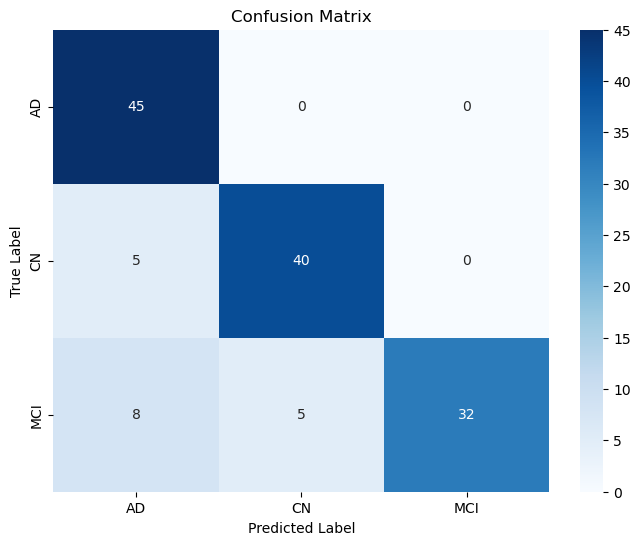

AUC-ROC AD: 0.9847
AUC-ROC CN: 0.9585
AUC-ROC MCI: 0.9654
Cohen's Kappa: 0.8000


In [15]:
print("🔬 Evaluating model on test set...")
all_preds, all_labels, all_probs = evaluate_model(model, test_loader)

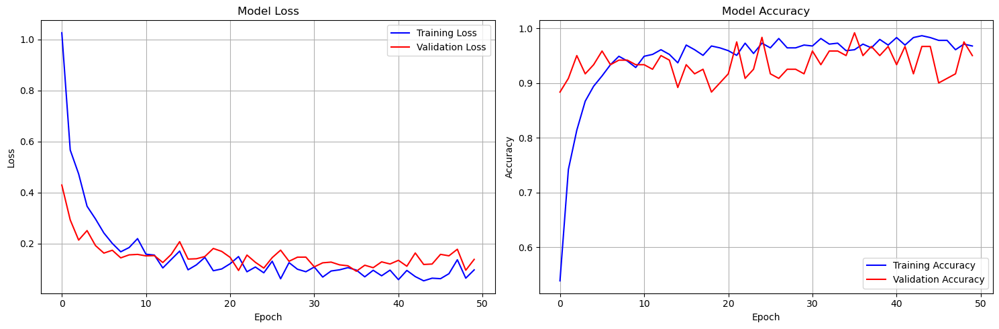

In [16]:
def plot_training_history(history):
    """Plot training and validation metrics"""
    # Ensure all tensors are converted to CPU lists
    train_loss = [x.cpu().item() if torch.is_tensor(x) else x for x in history['train_loss']]
    val_loss = [x.cpu().item() if torch.is_tensor(x) else x for x in history['val_loss']]
    train_acc = [x.cpu().item() if torch.is_tensor(x) else x for x in history['train_acc']]
    val_acc = [x.cpu().item() if torch.is_tensor(x) else x for x in history['val_acc']]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # Loss plot
    ax1.plot(train_loss, label='Training Loss', color='blue')   # ← use cleaned data
    ax1.plot(val_loss, label='Validation Loss', color='red')
    ax1.set_title('Model Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.grid(True)

    # Accuracy plot
    ax2.plot(train_acc, label='Training Accuracy', color='blue')  # ← use cleaned data
    ax2.plot(val_acc, label='Validation Accuracy', color='red')
    ax2.set_title('Model Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

# Plot the training history
plot_training_history(history)

🔍 Generating Grad-CAM visualizations...


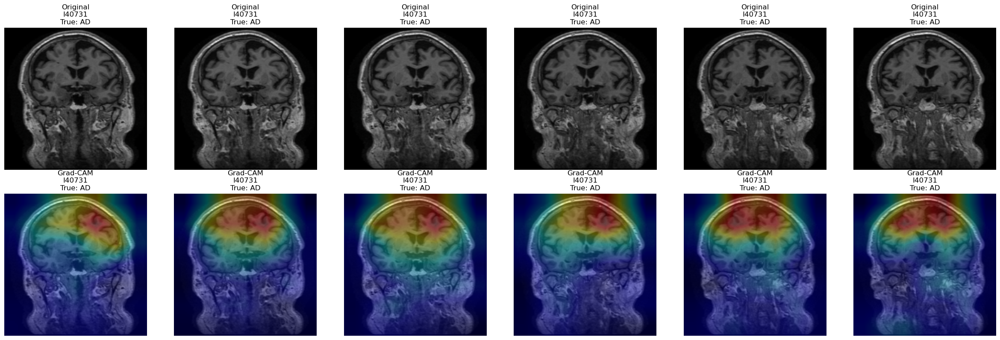

In [17]:
# Install required packages if not already installed
# !pip install grad-cam opencv-python

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import cv2
import numpy as np
import matplotlib.pyplot as plt

def generate_gradcam(model, image_tensor, target_class, target_layers, device):
    """
    Generate Grad-CAM visualization for a given image and target class
    """
    # Ensure model is in eval mode
    model.eval()
    
    # Move image to device and add batch dimension if needed
    if len(image_tensor.shape) == 3:
        image_tensor = image_tensor.unsqueeze(0)
    image_tensor = image_tensor.to(device)
    
    # Initialize Grad-CAM (removed use_cuda parameter)
    cam = GradCAM(
        model=model, 
        target_layers=target_layers
    )
    
    # Define target class
    targets = [ClassifierOutputTarget(target_class)]
    
    # Generate CAM
    grayscale_cam = cam(input_tensor=image_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]  # Remove batch dimension
    
    return grayscale_cam

def visualize_gradcam_results(model, test_loader, num_samples=6, device=device):
    """
    Generate and visualize Grad-CAM results for multiple test samples
    """
    model.eval()
    
    # Get a few samples from test set
    samples = []
    sample_count = 0
    
    with torch.no_grad():
        for inputs, labels, subject_ids in test_loader:
            if sample_count >= num_samples:
                break
            for i in range(min(inputs.size(0), num_samples - sample_count)):
                samples.append({
                    'input': inputs[i],
                    'label': labels[i],
                    'subject_id': subject_ids[i]
                })
                sample_count += 1
                if sample_count >= num_samples:
                    break
    
    # Define target layers for Grad-CAM (last convolutional layer of EfficientNet)
    target_layers = [model.feature_extractor[-1]]
    
    # Class names
    class_names = ['AD', 'CN', 'MCI']
    
    # Create subplot grid
    fig, axes = plt.subplots(2, num_samples, figsize=(4*num_samples, 8))
    if num_samples == 1:
        axes = axes.reshape(2, 1)
    
    for i, sample in enumerate(samples):
        input_tensor = sample['input']
        true_label = sample['label'].item()
        subject_id = sample['subject_id']
        
        # Generate Grad-CAM for the true class
        grayscale_cam = generate_gradcam(
            model, input_tensor, true_label, target_layers, device
        )
        
        # Convert input tensor to numpy for visualization
        input_image = input_tensor.permute(1, 2, 0).cpu().numpy()
        
        # Denormalize the image (reverse ImageNet normalization)
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        input_image = input_image * std + mean
        input_image = np.clip(input_image, 0, 1)
        
        # Keep as float32 in range [0, 1] for show_cam_on_image
        input_image_float = input_image.astype(np.float32)
        
        # Generate Grad-CAM visualization
        visualization = show_cam_on_image(
            input_image_float, 
            grayscale_cam, 
            use_rgb=True,
            image_weight=0.7
        )
        
        # Plot original image
        axes[0, i].imshow(input_image)
        axes[0, i].set_title(f'Original\n{subject_id}\nTrue: {class_names[true_label]}')
        axes[0, i].axis('off')
        
        # Plot Grad-CAM visualization
        axes[1, i].imshow(visualization)
        axes[1, i].set_title(f'Grad-CAM\n{subject_id}\nTrue: {class_names[true_label]}')
        axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return samples

# Generate Grad-CAM visualizations
print("🔍 Generating Grad-CAM visualizations...")
gradcam_samples = visualize_gradcam_results(model, test_loader, num_samples=6, device=device)

🔍 Generating Grad-CAM visualizations for different subjects...


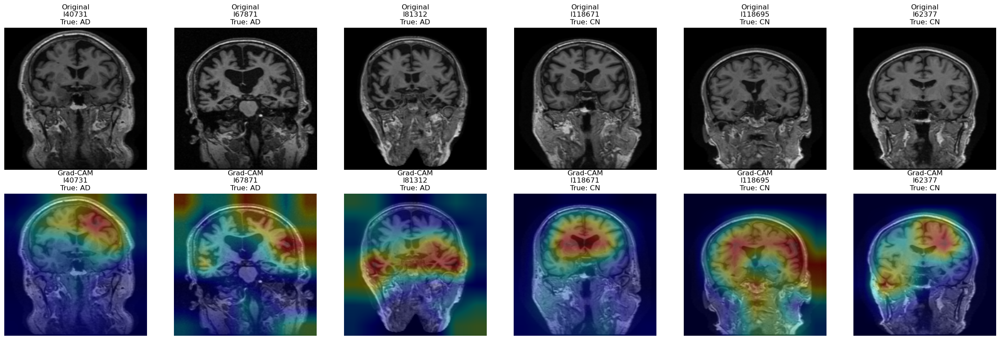

In [18]:
def visualize_gradcam_results_different_subjects(model, test_loader, num_samples=6, device=device):
    """
    Generate and visualize Grad-CAM results for different subjects
    """
    model.eval()
    
    # Get samples from different subjects
    samples = []
    seen_subjects = set()
    
    with torch.no_grad():
        for inputs, labels, subject_ids in test_loader:
            for i in range(inputs.size(0)):
                subject_id = subject_ids[i]
                
                # Only add if we haven't seen this subject yet
                if subject_id not in seen_subjects and len(samples) < num_samples:
                    samples.append({
                        'input': inputs[i],
                        'label': labels[i],
                        'subject_id': subject_id
                    })
                    seen_subjects.add(subject_id)
                    
                    if len(samples) >= num_samples:
                        break
            if len(samples) >= num_samples:
                break
    
    # Define target layers for Grad-CAM
    target_layers = [model.feature_extractor[-1]]
    
    # Class names
    class_names = ['AD', 'CN', 'MCI']
    
    # Create subplot grid
    fig, axes = plt.subplots(2, len(samples), figsize=(4*len(samples), 8))
    if len(samples) == 1:
        axes = axes.reshape(2, 1)
    
    for i, sample in enumerate(samples):
        input_tensor = sample['input']
        true_label = sample['label'].item()
        subject_id = sample['subject_id']
        
        # Generate Grad-CAM for the true class
        grayscale_cam = generate_gradcam(
            model, input_tensor, true_label, target_layers, device
        )
        
        # Convert input tensor to numpy for visualization
        input_image = input_tensor.permute(1, 2, 0).cpu().numpy()
        
        # Denormalize the image
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        input_image = input_image * std + mean
        input_image = np.clip(input_image, 0, 1)
        
        # Keep as float32 for show_cam_on_image
        input_image_float = input_image.astype(np.float32)
        
        # Generate Grad-CAM visualization
        visualization = show_cam_on_image(
            input_image_float, 
            grayscale_cam, 
            use_rgb=True,
            image_weight=0.7
        )
        
        # Plot original image
        axes[0, i].imshow(input_image)
        axes[0, i].set_title(f'Original\n{subject_id}\nTrue: {class_names[true_label]}')
        axes[0, i].axis('off')
        
        # Plot Grad-CAM visualization
        axes[1, i].imshow(visualization)
        axes[1, i].set_title(f'Grad-CAM\n{subject_id}\nTrue: {class_names[true_label]}')
        axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return samples

# Run with different subjects
print("🔍 Generating Grad-CAM visualizations for different subjects...")
different_subject_samples = visualize_gradcam_results_different_subjects(model, test_loader, num_samples=6, device=device)

🔍 Generating Grad-CAM for many different subjects...


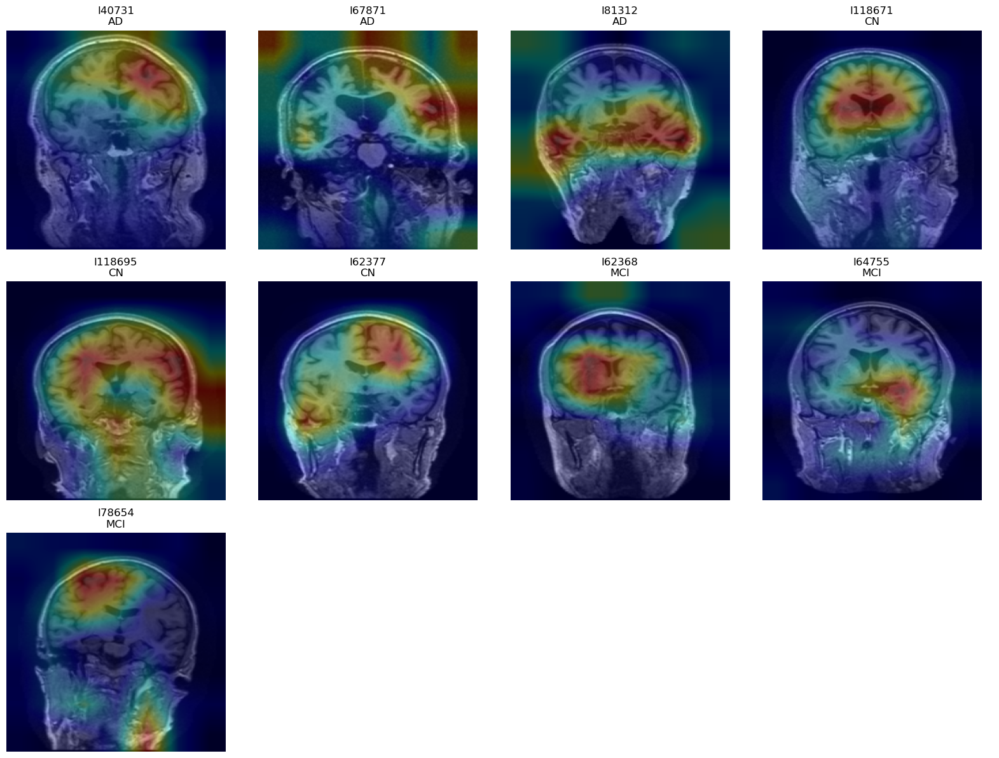

In [19]:
def visualize_gradcam_many_subjects(model, test_loader, num_subjects=12, device=device):
    """
    Show Grad-CAM for many different subjects (one sample each)
    """
    model.eval()
    
    # Get one sample from each subject
    samples = []
    seen_subjects = set()
    
    with torch.no_grad():
        for inputs, labels, subject_ids in test_loader:
            for i in range(inputs.size(0)):
                subject_id = subject_ids[i]
                
                if subject_id not in seen_subjects and len(samples) < num_subjects:
                    samples.append({
                        'input': inputs[i],
                        'label': labels[i],
                        'subject_id': subject_id
                    })
                    seen_subjects.add(subject_id)
                    
                    if len(samples) >= num_subjects:
                        break
            if len(samples) >= num_subjects:
                break
    
    # Create a larger grid
    cols = 4  # 4 columns
    rows = (len(samples) + cols - 1) // cols  # Calculate rows needed
    
    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    if rows == 1:
        axes = axes.reshape(1, -1)
    elif cols == 1:
        axes = axes.reshape(-1, 1)
    
    target_layers = [model.feature_extractor[-1]]
    class_names = ['AD', 'CN', 'MCI']
    
    for i, sample in enumerate(samples):
        row = i // cols
        col = i % cols
        
        input_tensor = sample['input']
        true_label = sample['label'].item()
        subject_id = sample['subject_id']
        
        # Generate Grad-CAM
        grayscale_cam = generate_gradcam(
            model, input_tensor, true_label, target_layers, device
        )
        
        # Process image
        input_image = input_tensor.permute(1, 2, 0).cpu().numpy()
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        input_image = input_image * std + mean
        input_image = np.clip(input_image, 0, 1)
        input_image_float = input_image.astype(np.float32)
        
        # Create visualization
        visualization = show_cam_on_image(
            input_image_float, 
            grayscale_cam, 
            use_rgb=True,
            image_weight=0.7
        )
        
        # Plot
        axes[row, col].imshow(visualization)
        axes[row, col].set_title(f'{subject_id}\n{class_names[true_label]}')
        axes[row, col].axis('off')
    
    # Hide empty subplots
    for i in range(len(samples), rows * cols):
        row = i // cols
        col = i % cols
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return samples

# Show many different subjects
print("🔍 Generating Grad-CAM for many different subjects...")
many_subject_samples = visualize_gradcam_many_subjects(model, test_loader, num_subjects=12, device=device)

🔍 Generating Grad-CAM organized by class and different subjects...


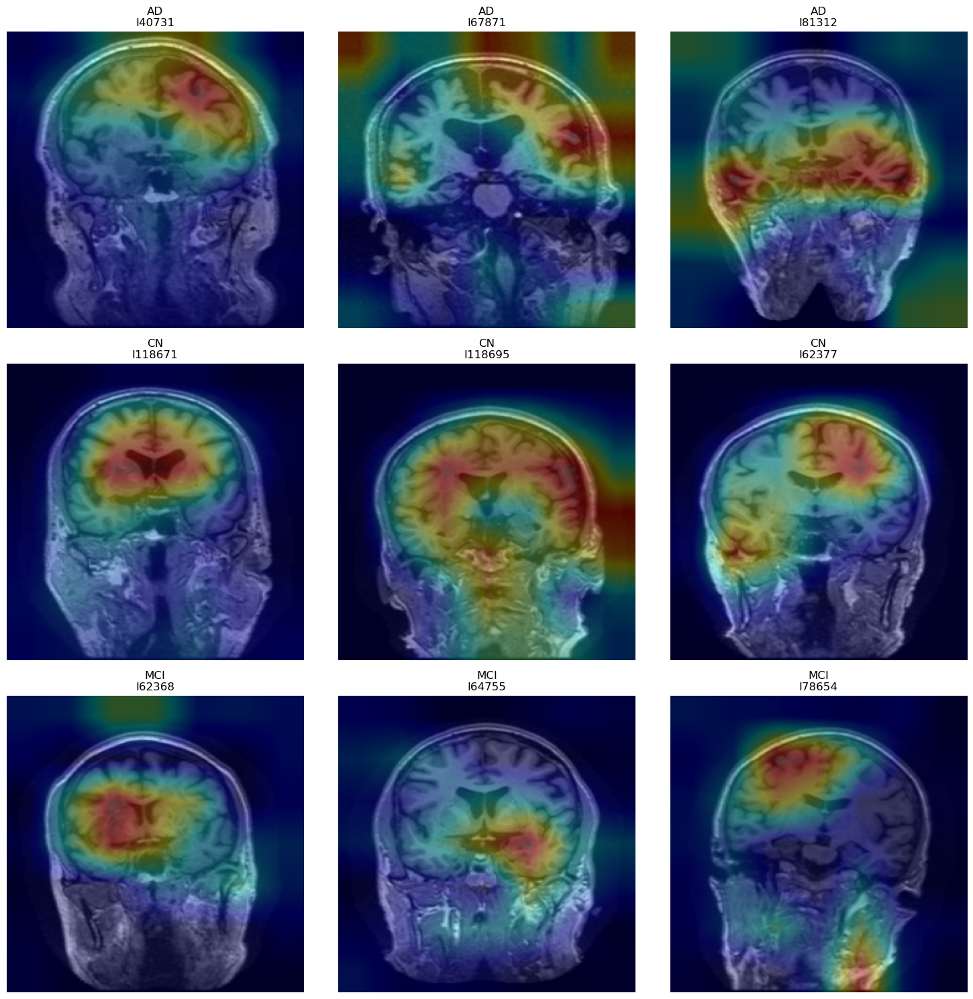

In [20]:
def visualize_gradcam_by_class_and_subject(model, test_loader, device=device):
    """
    Show Grad-CAM organized by class and different subjects
    """
    model.eval()
    
    # Organize samples by class
    samples_by_class = {'AD': [], 'CN': [], 'MCI': []}
    class_names = ['AD', 'CN', 'MCI']
    
    with torch.no_grad():
        for inputs, labels, subject_ids in test_loader:
            for i in range(inputs.size(0)):
                label = labels[i].item()
                class_name = class_names[label]
                subject_id = subject_ids[i]
                
                # Only add if we don't already have this subject for this class
                existing_subjects = [s['subject_id'] for s in samples_by_class[class_name]]
                if subject_id not in existing_subjects and len(samples_by_class[class_name]) < 3:
                    samples_by_class[class_name].append({
                        'input': inputs[i],
                        'label': labels[i],
                        'subject_id': subject_id
                    })
    
    # Create visualization
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    target_layers = [model.feature_extractor[-1]]
    
    for class_idx, class_name in enumerate(class_names):
        for sample_idx, sample in enumerate(samples_by_class[class_name]):
            input_tensor = sample['input']
            subject_id = sample['subject_id']
            
            # Generate Grad-CAM
            grayscale_cam = generate_gradcam(
                model, input_tensor, class_idx, target_layers, device
            )
            
            # Process image
            input_image = input_tensor.permute(1, 2, 0).cpu().numpy()
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            input_image = input_image * std + mean
            input_image = np.clip(input_image, 0, 1)
            input_image_float = input_image.astype(np.float32)
            
            # Create visualization
            visualization = show_cam_on_image(
                input_image_float, 
                grayscale_cam, 
                use_rgb=True,
                image_weight=0.7
            )
            
            # Plot
            axes[class_idx, sample_idx].imshow(visualization)
            axes[class_idx, sample_idx].set_title(f'{class_name}\n{subject_id}')
            axes[class_idx, sample_idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return samples_by_class

# Show organized by class and different subjects
print("🔍 Generating Grad-CAM organized by class and different subjects...")
class_subject_samples = visualize_gradcam_by_class_and_subject(model, test_loader, device=device)

🔍 Analyzing misclassified samples with Grad-CAM...


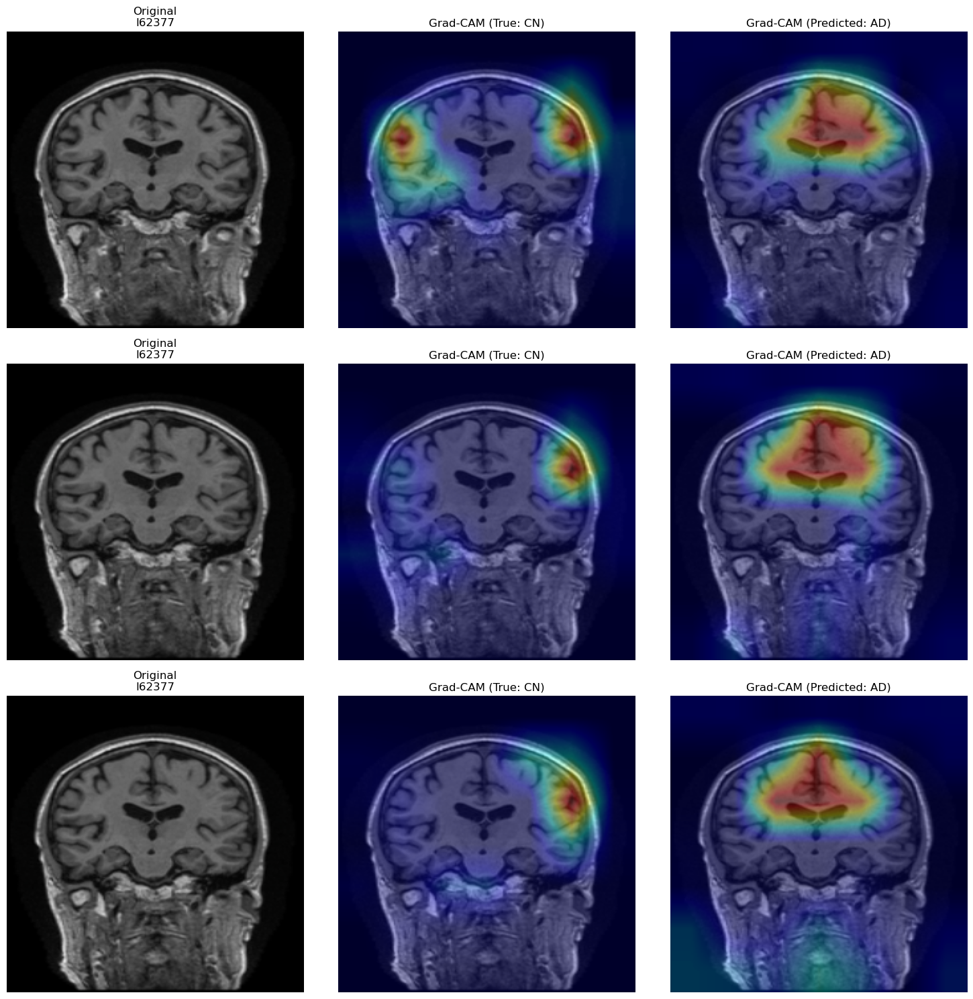

🔍 Analyzed 3 misclassified samples


In [21]:
def analyze_misclassified_gradcam(model, test_loader, device=device):
    """
    Analyze Grad-CAM for misclassified samples to understand model errors
    """
    model.eval()
    
    misclassified_samples = []
    
    with torch.no_grad():
        for inputs, labels, subject_ids in test_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            
            # Find misclassified samples
            misclassified_mask = preds != labels
            if misclassified_mask.any():
                for i in range(inputs.size(0)):
                    if misclassified_mask[i]:
                        misclassified_samples.append({
                            'input': inputs[i].cpu(),
                            'true_label': labels[i].item(),
                            'predicted_label': preds[i].item(),
                            'subject_id': subject_ids[i]
                        })
                        
                        if len(misclassified_samples) >= 3:  # Limit to 3 samples
                            break
                if len(misclassified_samples) >= 3:
                    break
    
    if not misclassified_samples:
        print("✅ No misclassified samples found!")
        return
    
    # Visualize misclassified samples with Grad-CAM
    class_names = ['AD', 'CN', 'MCI']
    target_layers = [model.feature_extractor[-1]]
    
    fig, axes = plt.subplots(len(misclassified_samples), 3, figsize=(15, 5*len(misclassified_samples)))
    if len(misclassified_samples) == 1:
        axes = axes.reshape(1, 3)
    
    for i, sample in enumerate(misclassified_samples):
        input_tensor = sample['input']
        true_label = sample['true_label']
        pred_label = sample['predicted_label']
        subject_id = sample['subject_id']
        
        # Generate Grad-CAM for true class
        true_cam = generate_gradcam(model, input_tensor, true_label, target_layers, device)
        
        # Generate Grad-CAM for predicted class
        pred_cam = generate_gradcam(model, input_tensor, pred_label, target_layers, device)
        
        # Convert input tensor to numpy
        input_image = input_tensor.permute(1, 2, 0).numpy()
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        input_image = input_image * std + mean
        input_image = np.clip(input_image, 0, 1)
        
        # Keep as float32 in range [0, 1] for show_cam_on_image
        input_image_float = input_image.astype(np.float32)
        
        # Create visualizations
        true_vis = show_cam_on_image(input_image_float, true_cam, use_rgb=True, image_weight=0.7)
        pred_vis = show_cam_on_image(input_image_float, pred_cam, use_rgb=True, image_weight=0.7)
        
        # Plot
        axes[i, 0].imshow(input_image)
        axes[i, 0].set_title(f'Original\n{subject_id}')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(true_vis)
        axes[i, 1].set_title(f'Grad-CAM (True: {class_names[true_label]})')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(pred_vis)
        axes[i, 2].set_title(f'Grad-CAM (Predicted: {class_names[pred_label]})')
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"🔍 Analyzed {len(misclassified_samples)} misclassified samples")

# Analyze misclassified samples
print("🔍 Analyzing misclassified samples with Grad-CAM...")
analyze_misclassified_gradcam(model, test_loader, device=device)

🔍 Generating Grad-CAM++ visualizations...


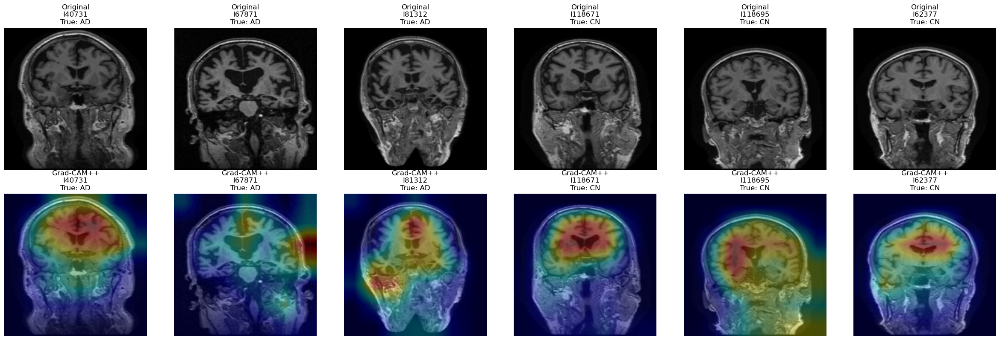

In [22]:
from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import cv2
import numpy as np
import matplotlib.pyplot as plt

def generate_gradcam_plus_plus(model, image_tensor, target_class, target_layers, device):
    """
    Generate Grad-CAM++ visualization for a given image and target class
    """
    # Ensure model is in eval mode
    model.eval()
    
    # Move image to device and add batch dimension if needed
    if len(image_tensor.shape) == 3:
        image_tensor = image_tensor.unsqueeze(0)
    image_tensor = image_tensor.to(device)
    
    # Initialize Grad-CAM++
    cam = GradCAMPlusPlus(
        model=model, 
        target_layers=target_layers
    )
    
    # Define target class
    targets = [ClassifierOutputTarget(target_class)]
    
    # Generate CAM
    grayscale_cam = cam(input_tensor=image_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]  # Remove batch dimension
    
    return grayscale_cam

def visualize_gradcam_plus_plus_results(model, test_loader, num_samples=6, device=device):
    """
    Generate and visualize Grad-CAM++ results for multiple test samples
    """
    model.eval()
    
    # Get samples from different subjects
    samples = []
    seen_subjects = set()
    
    with torch.no_grad():
        for inputs, labels, subject_ids in test_loader:
            for i in range(inputs.size(0)):
                subject_id = subject_ids[i]
                
                # Only add if we haven't seen this subject yet
                if subject_id not in seen_subjects and len(samples) < num_samples:
                    samples.append({
                        'input': inputs[i],
                        'label': labels[i],
                        'subject_id': subject_id
                    })
                    seen_subjects.add(subject_id)
                    
                    if len(samples) >= num_samples:
                        break
            if len(samples) >= num_samples:
                break
    
    # Define target layers for Grad-CAM++
    target_layers = [model.feature_extractor[-1]]
    
    # Class names
    class_names = ['AD', 'CN', 'MCI']
    
    # Create subplot grid
    fig, axes = plt.subplots(2, len(samples), figsize=(4*len(samples), 8))
    if len(samples) == 1:
        axes = axes.reshape(2, 1)
    
    for i, sample in enumerate(samples):
        input_tensor = sample['input']
        true_label = sample['label'].item()
        subject_id = sample['subject_id']
        
        # Generate Grad-CAM++ for the true class
        grayscale_cam = generate_gradcam_plus_plus(
            model, input_tensor, true_label, target_layers, device
        )
        
        # Convert input tensor to numpy for visualization
        input_image = input_tensor.permute(1, 2, 0).cpu().numpy()
        
        # Denormalize the image
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        input_image = input_image * std + mean
        input_image = np.clip(input_image, 0, 1)
        
        # Keep as float32 for show_cam_on_image
        input_image_float = input_image.astype(np.float32)
        
        # Generate Grad-CAM++ visualization
        visualization = show_cam_on_image(
            input_image_float, 
            grayscale_cam, 
            use_rgb=True,
            image_weight=0.7
        )
        
        # Plot original image
        axes[0, i].imshow(input_image)
        axes[0, i].set_title(f'Original\n{subject_id}\nTrue: {class_names[true_label]}')
        axes[0, i].axis('off')
        
        # Plot Grad-CAM++ visualization
        axes[1, i].imshow(visualization)
        axes[1, i].set_title(f'Grad-CAM++\n{subject_id}\nTrue: {class_names[true_label]}')
        axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return samples

# Generate Grad-CAM++ visualizations
print("🔍 Generating Grad-CAM++ visualizations...")
gradcam_plus_plus_samples = visualize_gradcam_plus_plus_results(model, test_loader, num_samples=6, device=device)

�� Comparing Grad-CAM vs Grad-CAM++...


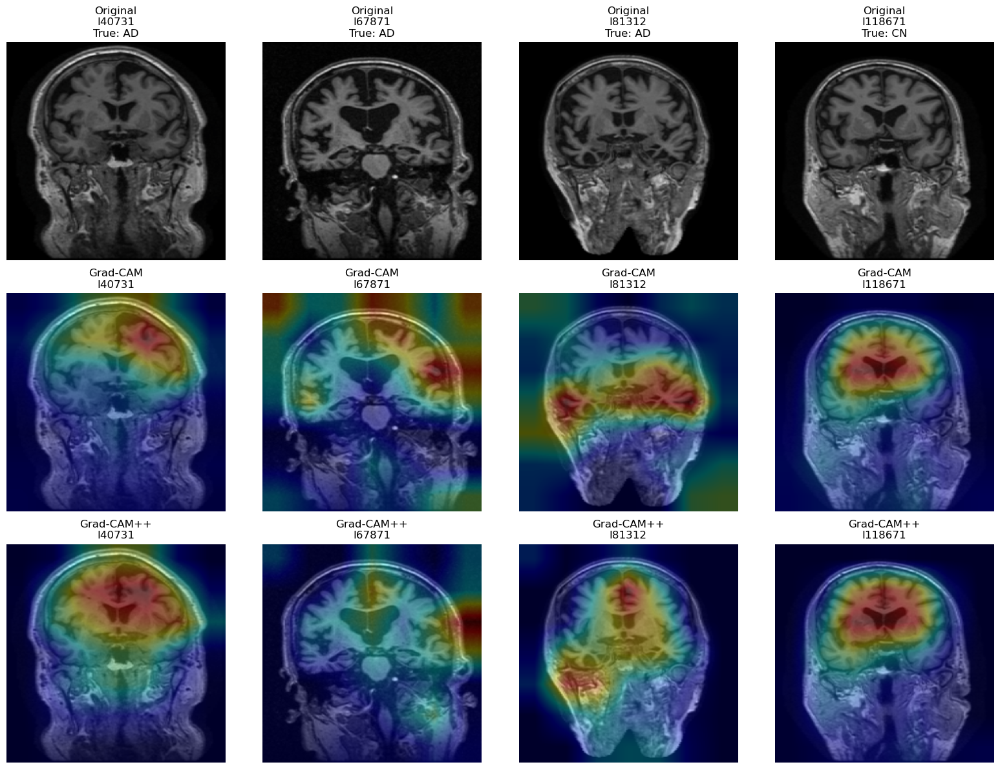

In [23]:
def compare_gradcam_vs_gradcam_plus_plus(model, test_loader, num_samples=4, device=device):
    """
    Compare Grad-CAM vs Grad-CAM++ side by side
    """
    model.eval()
    
    # Get samples from different subjects
    samples = []
    seen_subjects = set()
    
    with torch.no_grad():
        for inputs, labels, subject_ids in test_loader:
            for i in range(inputs.size(0)):
                subject_id = subject_ids[i]
                
                if subject_id not in seen_subjects and len(samples) < num_samples:
                    samples.append({
                        'input': inputs[i],
                        'label': labels[i],
                        'subject_id': subject_id
                    })
                    seen_subjects.add(subject_id)
                    
                    if len(samples) >= num_samples:
                        break
            if len(samples) >= num_samples:
                break
    
    # Define target layers
    target_layers = [model.feature_extractor[-1]]
    class_names = ['AD', 'CN', 'MCI']
    
    # Create subplot grid: 3 rows (Original, Grad-CAM, Grad-CAM++) x num_samples columns
    fig, axes = plt.subplots(3, len(samples), figsize=(4*len(samples), 12))
    if len(samples) == 1:
        axes = axes.reshape(3, 1)
    
    for i, sample in enumerate(samples):
        input_tensor = sample['input']
        true_label = sample['label'].item()
        subject_id = sample['subject_id']
        
        # Process image
        input_image = input_tensor.permute(1, 2, 0).cpu().numpy()
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        input_image = input_image * std + mean
        input_image = np.clip(input_image, 0, 1)
        input_image_float = input_image.astype(np.float32)
        
        # Generate Grad-CAM
        gradcam_result = generate_gradcam(
            model, input_tensor, true_label, target_layers, device
        )
        
        # Generate Grad-CAM++
        gradcam_plus_plus_result = generate_gradcam_plus_plus(
            model, input_tensor, true_label, target_layers, device
        )
        
        # Create visualizations
        gradcam_vis = show_cam_on_image(
            input_image_float, 
            gradcam_result, 
            use_rgb=True,
            image_weight=0.7
        )
        
        gradcam_plus_plus_vis = show_cam_on_image(
            input_image_float, 
            gradcam_plus_plus_result, 
            use_rgb=True,
            image_weight=0.7
        )
        
        # Plot original image
        axes[0, i].imshow(input_image)
        axes[0, i].set_title(f'Original\n{subject_id}\nTrue: {class_names[true_label]}')
        axes[0, i].axis('off')
        
        # Plot Grad-CAM
        axes[1, i].imshow(gradcam_vis)
        axes[1, i].set_title(f'Grad-CAM\n{subject_id}')
        axes[1, i].axis('off')
        
        # Plot Grad-CAM++
        axes[2, i].imshow(gradcam_plus_plus_vis)
        axes[2, i].set_title(f'Grad-CAM++\n{subject_id}')
        axes[2, i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return samples

# Compare Grad-CAM vs Grad-CAM++
print("�� Comparing Grad-CAM vs Grad-CAM++...")
comparison_samples = compare_gradcam_vs_gradcam_plus_plus(model, test_loader, num_samples=4, device=device)

🔍 Running advanced Grad-CAM++ analysis...


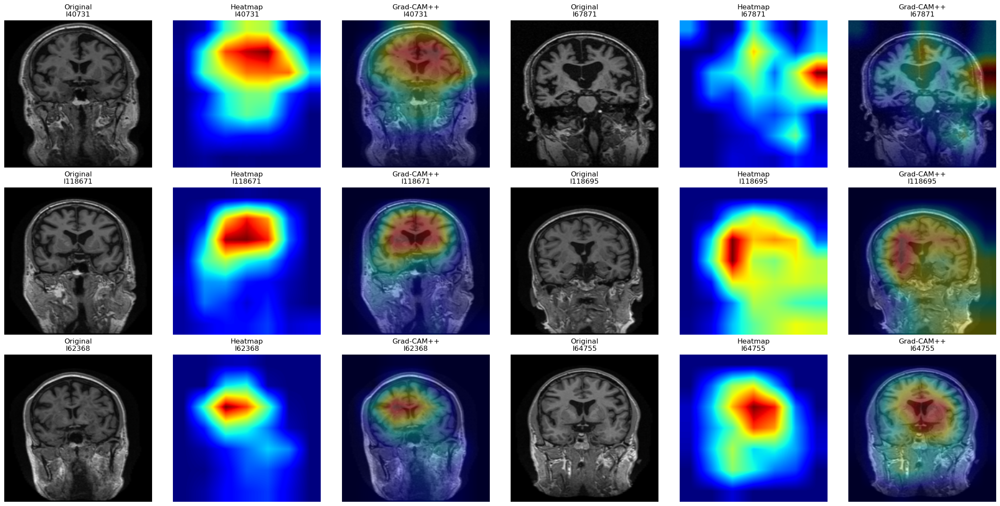

In [24]:
def advanced_gradcam_plus_plus_analysis(model, test_loader, device=device):
    """
    Advanced Grad-CAM++ analysis with multiple classes and detailed visualization
    """
    model.eval()
    
    # Get samples from different subjects and classes
    samples_by_class = {'AD': [], 'CN': [], 'MCI': []}
    class_names = ['AD', 'CN', 'MCI']
    
    with torch.no_grad():
        for inputs, labels, subject_ids in test_loader:
            for i in range(inputs.size(0)):
                label = labels[i].item()
                class_name = class_names[label]
                subject_id = subject_ids[i]
                
                # Get one sample per subject per class
                existing_subjects = [s['subject_id'] for s in samples_by_class[class_name]]
                if subject_id not in existing_subjects and len(samples_by_class[class_name]) < 2:
                    samples_by_class[class_name].append({
                        'input': inputs[i],
                        'label': labels[i],
                        'subject_id': subject_id
                    })
    
    # Create comprehensive visualization
    fig, axes = plt.subplots(3, 6, figsize=(24, 12))
    target_layers = [model.feature_extractor[-1]]
    
    for class_idx, class_name in enumerate(class_names):
        for sample_idx, sample in enumerate(samples_by_class[class_name]):
            input_tensor = sample['input']
            subject_id = sample['subject_id']
            
            # Process image
            input_image = input_tensor.permute(1, 2, 0).cpu().numpy()
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            input_image = input_image * std + mean
            input_image = np.clip(input_image, 0, 1)
            input_image_float = input_image.astype(np.float32)
            
            # Generate Grad-CAM++ for this class
            gradcam_plus_plus_result = generate_gradcam_plus_plus(
                model, input_tensor, class_idx, target_layers, device
            )
            
            # Create visualization
            visualization = show_cam_on_image(
                input_image_float, 
                gradcam_plus_plus_result, 
                use_rgb=True,
                image_weight=0.7
            )
            
            # Plot
            axes[class_idx, sample_idx * 3].imshow(input_image)
            axes[class_idx, sample_idx * 3].set_title(f'Original\n{subject_id}')
            axes[class_idx, sample_idx * 3].axis('off')
            
            axes[class_idx, sample_idx * 3 + 1].imshow(gradcam_plus_plus_result, cmap='jet')
            axes[class_idx, sample_idx * 3 + 1].set_title(f'Heatmap\n{subject_id}')
            axes[class_idx, sample_idx * 3 + 1].axis('off')
            
            axes[class_idx, sample_idx * 3 + 2].imshow(visualization)
            axes[class_idx, sample_idx * 3 + 2].set_title(f'Grad-CAM++\n{subject_id}')
            axes[class_idx, sample_idx * 3 + 2].axis('off')
    
    # Hide empty subplots
    for class_idx in range(3):
        for col in range(6):
            if col >= len(samples_by_class[class_names[class_idx]]) * 3:
                axes[class_idx, col].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return samples_by_class

# Run advanced analysis
print("🔍 Running advanced Grad-CAM++ analysis...")
advanced_samples = advanced_gradcam_plus_plus_analysis(model, test_loader, device=device)

🔍 Generating Integrated Gradients visualizations...
Generating IG for sample 1/4: I40731
Generating IG for sample 2/4: I67871
Generating IG for sample 3/4: I81312
Generating IG for sample 4/4: I118671


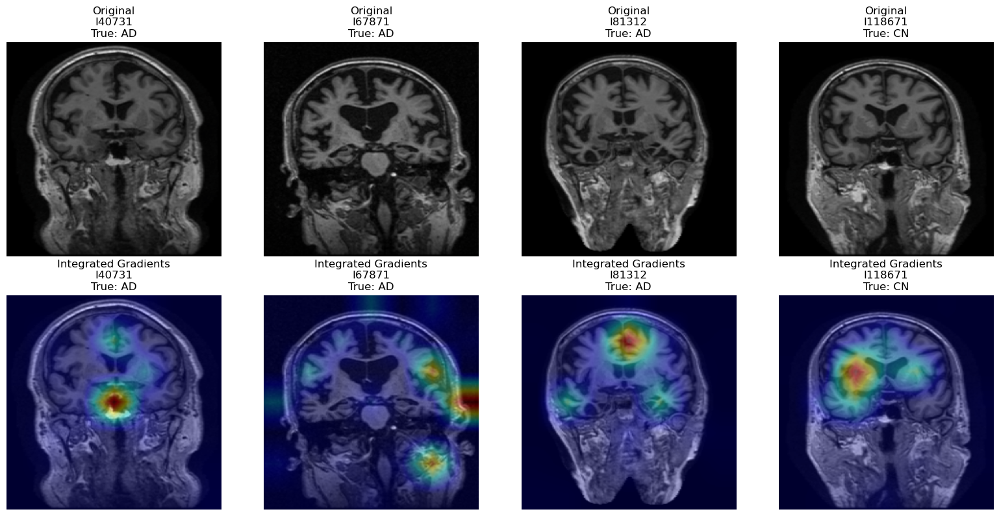

In [28]:
# Import only what's available and needed
from pytorch_grad_cam.utils.image import show_cam_on_image
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def generate_integrated_gradients(model, image_tensor, target_class, target_layers, device, steps=50):
    """
    Fixed implementation of Integrated Gradients
    """
    model.eval()
    
    # Add batch dimension if needed
    if len(image_tensor.shape) == 3:
        image_tensor = image_tensor.unsqueeze(0)
    image_tensor = image_tensor.to(device)
    
    # Create baseline (zero tensor)
    baseline = torch.zeros_like(image_tensor)
    
    # Generate interpolated inputs
    alphas = torch.linspace(0, 1, steps).to(device)
    interpolated_inputs = torch.stack([
        baseline + alpha * (image_tensor - baseline) for alpha in alphas
    ])
    
    # Calculate gradients for each interpolated input
    gradients = []
    for interp_input in interpolated_inputs:
        interp_input.requires_grad_(True)
        
        # Forward pass
        output = model(interp_input)
        target_output = output[0, target_class]
        
        # Backward pass
        target_output.backward()
        
        # Get gradients
        grad = interp_input.grad.clone()
        gradients.append(grad)
        
        # Reset gradients
        interp_input.grad.zero_()
    
    # Stack gradients
    gradients = torch.stack(gradients)
    
    # Calculate integrated gradients
    integrated_gradients = torch.mean(gradients, dim=0)
    
    # Generate heatmap using the target layer
    with torch.no_grad():
        # Get activations from target layer
        def hook_fn(module, input, output):
            hook_fn.activations = output
        
        # Register hook
        hook = target_layers[0].register_forward_hook(hook_fn)
        
        # Forward pass
        _ = model(image_tensor)
        
        # Get activations
        activations = hook_fn.activations
        
        # Remove hook
        hook.remove()
        
        # Weight the activations with integrated gradients
        if len(activations.shape) == 4:  # [batch, channels, height, width]
            # Convert integrated gradients to grayscale and resize to match activation spatial dimensions
            # Take the mean across RGB channels to get grayscale gradients
            integrated_gradients_gray = torch.mean(integrated_gradients, dim=1, keepdim=True)
            
            # Resize to match activation spatial dimensions
            integrated_gradients_resized = F.interpolate(
                integrated_gradients_gray, 
                size=activations.shape[2:], 
                mode='bilinear', 
                align_corners=False
            )
            
            # Weight each channel of activations with the same gradient map
            heatmap = torch.sum(activations * integrated_gradients_resized, dim=1)
        else:
            # Fallback for different activation shapes
            heatmap = torch.sum(activations * integrated_gradients, dim=1)
    
    # Convert to numpy and normalize
    heatmap = heatmap.squeeze().cpu().numpy()
    heatmap = np.maximum(heatmap, 0)  # ReLU
    heatmap = heatmap / (np.max(heatmap) + 1e-8)  # Normalize
    
    return heatmap

def visualize_integrated_gradients_results(model, test_loader, num_samples=6, device=device):
    """
    Generate and visualize Integrated Gradients results for multiple test samples
    """
    model.eval()
    
    # Get samples from different subjects
    samples = []
    seen_subjects = set()
    
    with torch.no_grad():
        for inputs, labels, subject_ids in test_loader:
            for i in range(inputs.size(0)):
                subject_id = subject_ids[i]
                
                # Only add if we haven't seen this subject yet
                if subject_id not in seen_subjects and len(samples) < num_samples:
                    samples.append({
                        'input': inputs[i],
                        'label': labels[i],
                        'subject_id': subject_id
                    })
                    seen_subjects.add(subject_id)
                    
                    if len(samples) >= num_samples:
                        break
            if len(samples) >= num_samples:
                break
    
    # Define target layers for Integrated Gradients
    target_layers = [model.feature_extractor[-1]]
    
    # Class names
    class_names = ['AD', 'CN', 'MCI']
    
    # Create subplot grid
    fig, axes = plt.subplots(2, len(samples), figsize=(4*len(samples), 8))
    if len(samples) == 1:
        axes = axes.reshape(2, 1)
    
    for i, sample in enumerate(samples):
        input_tensor = sample['input']
        true_label = sample['label'].item()
        subject_id = sample['subject_id']
        
        print(f"Generating IG for sample {i+1}/{len(samples)}: {subject_id}")
        
        # Generate Integrated Gradients for the true class
        grayscale_cam = generate_integrated_gradients(
            model, input_tensor, true_label, target_layers, device, steps=30
        )
        
        # Convert input tensor to numpy for visualization
        input_image = input_tensor.permute(1, 2, 0).cpu().numpy()
        
        # Denormalize the image
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        input_image = input_image * std + mean
        input_image = np.clip(input_image, 0, 1)
        
        # Keep as float32 for show_cam_on_image
        input_image_float = input_image.astype(np.float32)
        
        # Resize heatmap to match image dimensions
        heatmap_resized = np.array(Image.fromarray(grayscale_cam).resize(
            (input_image_float.shape[1], input_image_float.shape[0]), 
            Image.BILINEAR
        ))
        
        # Generate Integrated Gradients visualization
        visualization = show_cam_on_image(
            input_image_float, 
            heatmap_resized, 
            use_rgb=True,
            image_weight=0.7
        )
        
        # Plot original image
        axes[0, i].imshow(input_image)
        axes[0, i].set_title(f'Original\n{subject_id}\nTrue: {class_names[true_label]}')
        axes[0, i].axis('off')
        
        # Plot Integrated Gradients visualization
        axes[1, i].imshow(visualization)
        axes[1, i].set_title(f'Integrated Gradients\n{subject_id}\nTrue: {class_names[true_label]}')
        axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return samples

# Generate Integrated Gradients visualizations
print("🔍 Generating Integrated Gradients visualizations...")
ig_samples = visualize_integrated_gradients_results(model, test_loader, num_samples=4, device=device)

In [29]:
def visualize_attention_weights(model, image_tensor, device):
    """Extract and visualize attention weights from transformer-based models"""
    model.eval()
    
    # Hook to capture attention weights
    attention_weights = []
    def attention_hook(module, input, output):
        attention_weights.append(output.detach())
    
    # Register hooks on attention layers
    hooks = []
    for name, module in model.named_modules():
        if 'attention' in name.lower() or 'attn' in name.lower():
            hook = module.register_forward_hook(attention_hook)
            hooks.append(hook)
    
    # Forward pass
    with torch.no_grad():
        _ = model(image_tensor.to(device))
    
    # Remove hooks
    for hook in hooks:
        hook.remove()
    
    return attention_weights